<h1>Aplicacion de modelos no supervisados.<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Definicion-del-problema." data-toc-modified-id="Definicion-del-problema.-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Definicion del problema.</a></span></li><li><span><a href="#Librerías-generales" data-toc-modified-id="Librerías-generales-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>Librerías generales</a></span><ul class="toc-item"><li><span><a href="#Importacion-de-datos" data-toc-modified-id="Importacion-de-datos-2.1"><span class="toc-item-num">2.1&nbsp;&nbsp;</span>Importacion de datos</a></span></li><li><span><a href="#Kmeans" data-toc-modified-id="Kmeans-2.2"><span class="toc-item-num">2.2&nbsp;&nbsp;</span>Kmeans</a></span></li><li><span><a href="#Kmediod" data-toc-modified-id="Kmediod-2.3"><span class="toc-item-num">2.3&nbsp;&nbsp;</span>Kmediod</a></span></li><li><span><a href="#Agnes" data-toc-modified-id="Agnes-2.4"><span class="toc-item-num">2.4&nbsp;&nbsp;</span>Agnes</a></span></li><li><span><a href="#Birch" data-toc-modified-id="Birch-2.5"><span class="toc-item-num">2.5&nbsp;&nbsp;</span>Birch</a></span></li><li><span><a href="#DBSCAN" data-toc-modified-id="DBSCAN-2.6"><span class="toc-item-num">2.6&nbsp;&nbsp;</span>DBSCAN</a></span></li><li><span><a href="#Hierarchical" data-toc-modified-id="Hierarchical-2.7"><span class="toc-item-num">2.7&nbsp;&nbsp;</span>Hierarchical</a></span></li><li><span><a href="#Manifold" data-toc-modified-id="Manifold-2.8"><span class="toc-item-num">2.8&nbsp;&nbsp;</span>Manifold</a></span></li><li><span><a href="#DENCLUE" data-toc-modified-id="DENCLUE-2.9"><span class="toc-item-num">2.9&nbsp;&nbsp;</span>DENCLUE</a></span></li></ul></li></ul></div>

<img src=https://upload.wikimedia.org/wikipedia/commons/thumb/6/6e/Schrecklicherpfeilgiftfrosch-01.jpg/786px-Schrecklicherpfeilgiftfrosch-01.jpg>

## Definicion del problema.

El presente documento se realiza en base al Dataset **[MFCCs](https://archive.ics.uci.edu/ml/datasets/Anuran+Calls+%28MFCCs%29)** *(Anuran Calls)* el cual presenta datos relacionadas con el desafío del reconocimiento de especies de anuros (sapos y ranas) a través de sus llamadas. 

Algunas caracteristicas del Dataset son:
- conjunto de datos multietiqueta con tres columnas de etiquetas; se creó segmentando 60 registros de audio pertenecientes a 4 familias diferentes, 8 géneros y 10 especies. 
- Cada audio corresponde a un espécimen (una rana individual), la identificación del registro también se incluye como una columna adicional. 
- Presenta entropía espectral y un método de conglomerado binario para detectar tramas de audio pertenecientes a cada sílaba.
- La segmentación y extracción de características se realizó en Matlab.

<image src=https://upload.wikimedia.org/wikipedia/commons/c/c1/Anurans_from_the_RPPN_Serra_Bonita%2C_Bahia_State%2C_Northeastern_Brazil_-_1.jpg>

## Librerías generales

In [2]:
# Analisis de datos
import pandas as pd
import numpy as np
import random as rnd
import os

# Visualizacion
import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline 

from sklearn.model_selection import train_test_split
from sklearn.metrics import silhouette_score

# modelos
from sklearn.cluster import KMeans
from sklearn.cluster import Birch
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.decomposition import PCA
import scipy.cluster.hierarchy as shc
from sklearn.cluster import DBSCAN

import warnings
warnings.filterwarnings('ignore')


### Importacion de datos

In [3]:
df = pd.read_csv('anuran\Frogs_MFCCs.csv')
# Vemos como se presentan los datos.
df.head(3)

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,Family,Genus,Species,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,Leptodactylidae,Adenomera,AdenomeraAndre,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,Leptodactylidae,Adenomera,AdenomeraAndre,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,Leptodactylidae,Adenomera,AdenomeraAndre,1


Observamos si el dataset, necesita limpieza por valores nulos.

In [3]:
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7195 entries, 0 to 7194
Data columns (total 26 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   MFCCs_ 1  7195 non-null   float64
 1   MFCCs_ 2  7195 non-null   float64
 2   MFCCs_ 3  7195 non-null   float64
 3   MFCCs_ 4  7195 non-null   float64
 4   MFCCs_ 5  7195 non-null   float64
 5   MFCCs_ 6  7195 non-null   float64
 6   MFCCs_ 7  7195 non-null   float64
 7   MFCCs_ 8  7195 non-null   float64
 8   MFCCs_ 9  7195 non-null   float64
 9   MFCCs_10  7195 non-null   float64
 10  MFCCs_11  7195 non-null   float64
 11  MFCCs_12  7195 non-null   float64
 12  MFCCs_13  7195 non-null   float64
 13  MFCCs_14  7195 non-null   float64
 14  MFCCs_15  7195 non-null   float64
 15  MFCCs_16  7195 non-null   float64
 16  MFCCs_17  7195 non-null   float64
 17  MFCCs_18  7195 non-null   float64
 18  MFCCs_19  7195 non-null   float64
 19  MFCCs_20  7195 non-null   float64
 20  MFCCs_21  7195 non-null   floa

Se observa claramente que no existen datos nulos en los datos, lo cual nos  ahorrará un paso en el trabajo. Posteriormente, realizaremos un pairplot y una matriz de correlacion para conocer un poco más sobre los datos presentes.

<Figure size 640x480 with 0 Axes>

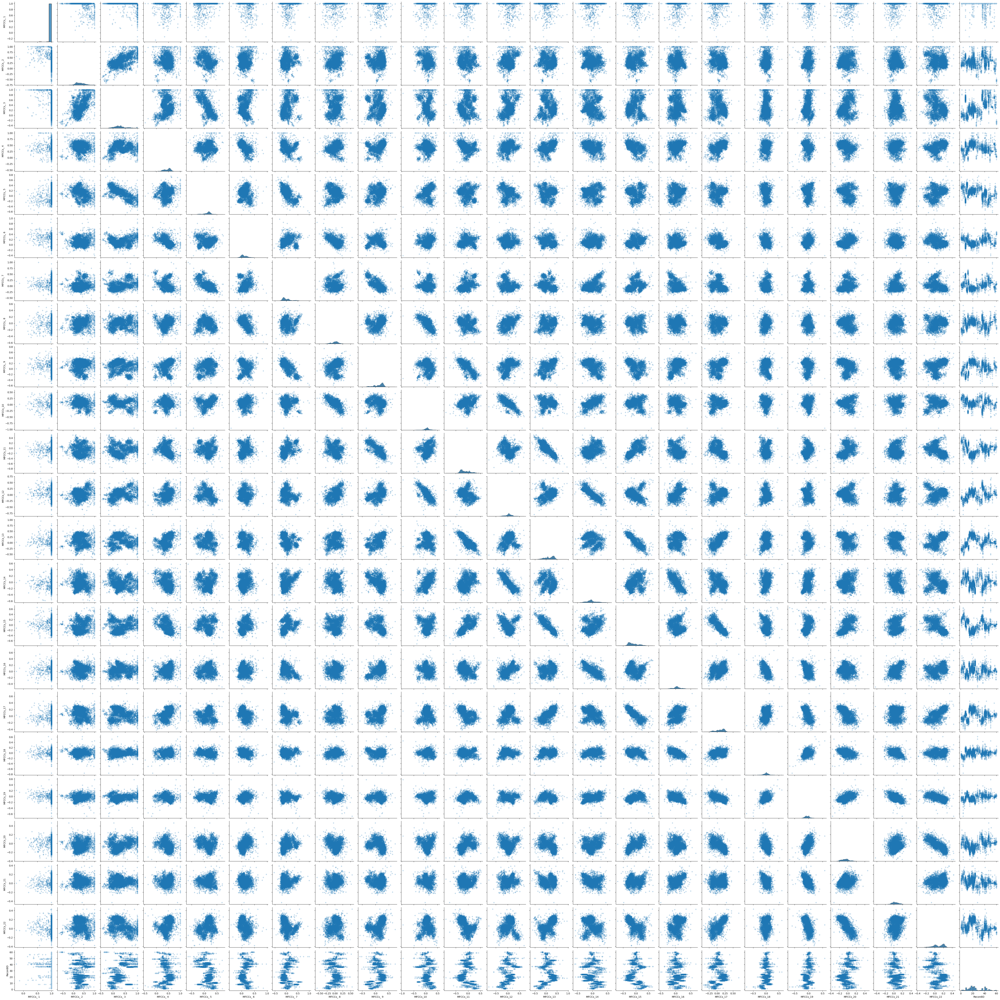

<Figure size 640x480 with 0 Axes>

In [10]:
plt.figure()
sns.pairplot(df, markers='+')
plt.show()
plt.savefig('pairplot')

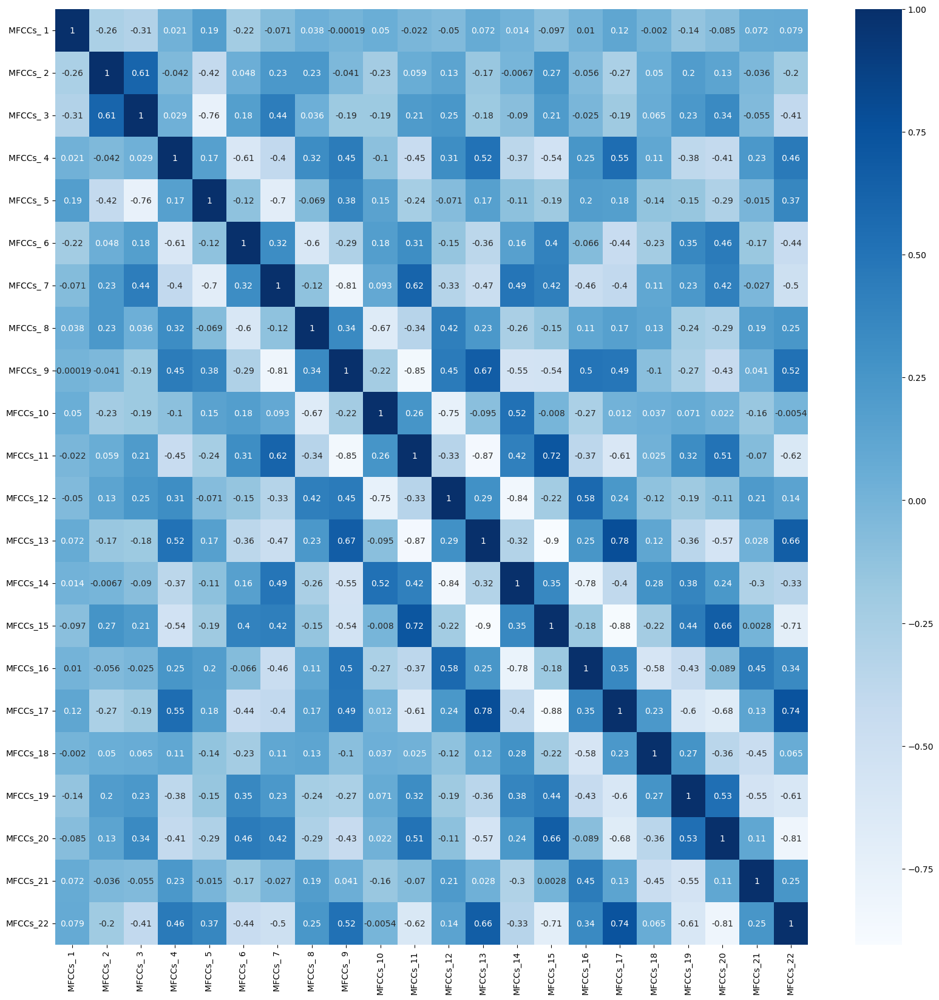

In [84]:
plt.figure(figsize=(20,20))
sns.heatmap(df.corr(), annot=True, cmap=plt.cm.Blues)
plt.savefig('corr')

## Implementación

Para esta sección se implemetarán 7 métodos de clustering, por lo tanto debemos eliminar las variables que no son de interés o son la solucion como por ejemplo la Familia a la que pertenecen.

In [86]:
#Eliminamos los elementos que no consideraremos (inicialmente, trabajaremos en base a las familias)
df.drop(columns=['Family', 'Genus','Species'],inplace=True)

In [7]:
df.head(3)

,MFCCs_ 1,MFCCs_ 2,MFCCs_ 3,MFCCs_ 4,MFCCs_ 5,MFCCs_ 6,MFCCs_ 7,MFCCs_ 8,MFCCs_ 9,MFCCs_10,...,MFCCs_14,MFCCs_15,MFCCs_16,MFCCs_17,MFCCs_18,MFCCs_19,MFCCs_20,MFCCs_21,MFCCs_22,RecordID
0,1.0,0.152936,-0.105586,0.200722,0.317201,0.260764,0.100945,-0.150063,-0.171128,0.124676,...,0.082245,0.135752,-0.024017,-0.108351,-0.077623,-0.009568,0.057684,0.118680,0.014038,1
1,1.0,0.171534,-0.098975,0.268425,0.338672,0.268353,0.060835,-0.222475,-0.207693,0.170883,...,0.022786,0.163320,0.012022,-0.090974,-0.056510,-0.035303,0.020140,0.082263,0.029056,1
2,1.0,0.152317,-0.082973,0.287128,0.276014,0.189867,0.008714,-0.242234,-0.219153,0.232538,...,0.050791,0.207338,0.083536,-0.050691,-0.023590,-0.066722,-0.025083,0.099108,0.077162,1


### Kmeans

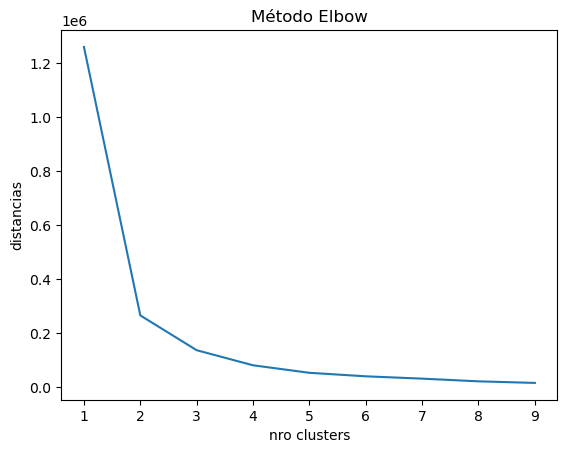

In [8]:
wss = []
for i in range(1,10):
    Kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42)
    Kmeans.fit(df)
    wss.append(Kmeans.inertia_)
    
plt.plot(range(1,10), wss)
plt.title('Método Elbow')
plt.xlabel('nro clusters')
plt.ylabel('distancias')
plt.show()

Revisamos ahora el Silhouette_score con relacion al numero de clusters

Para los clusters 1, el score es 0.6035558609837104
Para los clusters 2, el score es 0.6035558609837104
Para los clusters 3, el score es 0.6035558609837104
Para los clusters 4, el score es 0.6035558609837104
Para los clusters 5, el score es 0.6035558609837104
Para los clusters 6, el score es 0.6035558609837104
Para los clusters 7, el score es 0.6035558609837104
Para los clusters 8, el score es 0.6035558609837104
Para los clusters 9, el score es 0.6035558609837104


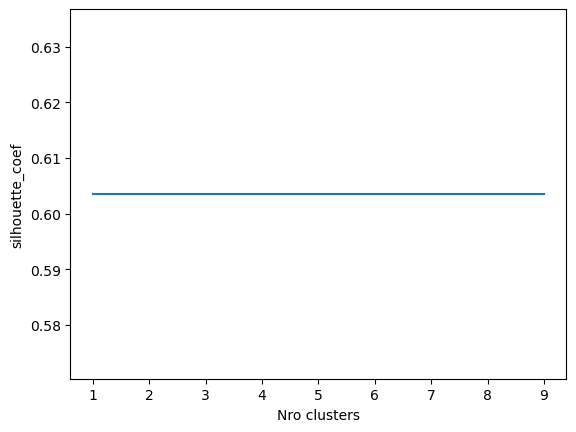

In [9]:
silhouette_coef = []
for i in range(1,10):
    kmeans = KMeans(n_clusters=i)
    kmeans.fit(df)
    score = silhouette_score(df, Kmeans.labels_)
    silhouette_coef.append(score)
    print("Para los clusters {}, el score es {}".format(i,score))

plt.plot(range(1,10), silhouette_coef)
plt.xticks(range(1,10))
plt.xlabel('Nro clusters')
plt.ylabel('silhouette_coef')
plt.show()

In [32]:
df1 = pd.read_csv('anuran\Frogs_MFCCs.csv')
df1.drop(columns=['Family', 'Genus','Species'],inplace=True)

In [33]:
scaler = StandardScaler()
X = scaler.fit_transform(df1)
kmeans = KMeans(n_clusters=4)
y = kmeans.fit_predict(X)
ul = np.unique(y)

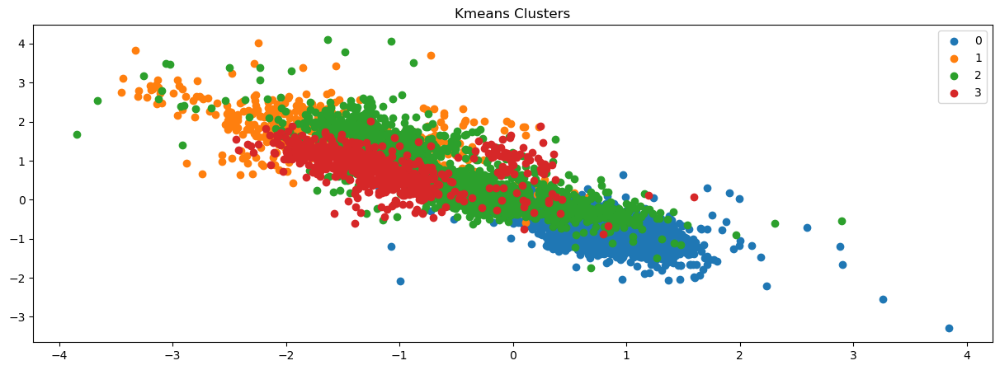

In [34]:
plt.figure(figsize=(15,5))
for i in ul:
    plt.scatter(X[y==i, 12], X[y==i, 14], label = i)
plt.title('Kmeans Clusters')
plt.legend()
plt.show()

En este caso, diferenciamos las 4 Familias que presentaba el dataset como los 4 clusters realizados

### Agnes

In [35]:
df2 = pd.read_csv('anuran\Frogs_MFCCs.csv')
df2.drop(columns=['Family', 'Genus','Species'],inplace=True)

In [36]:
scaler = StandardScaler()
X_agnes = scaler.fit_transform(df2)
agnes_model = AgglomerativeClustering(n_clusters=4)
y_agnes = agnes_model.fit_predict(X_agnes)
ul = np.unique(y_agnes)

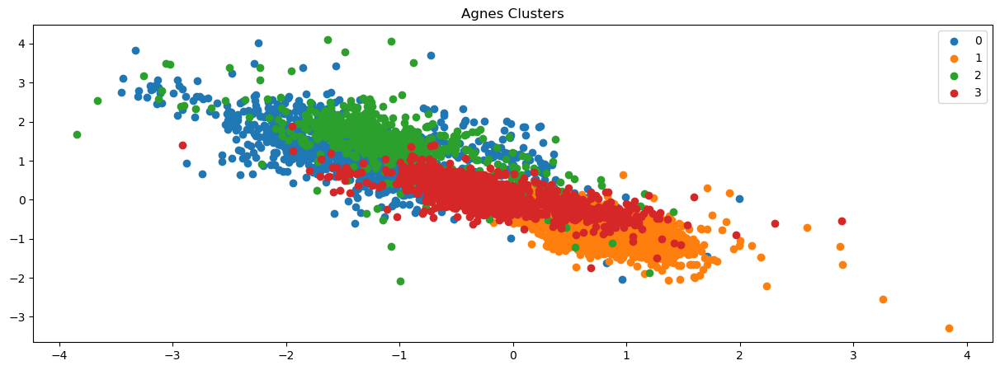

In [37]:
plt.figure(figsize=(15,5))
for i in ul:
    plt.scatter(X_agnes[y_agnes==i, 12], X_agnes[y_agnes==i, 14], label = i)
plt.title('Agnes Clusters')
plt.legend()
plt.show()

### Birch

In [38]:
df3 = pd.read_csv('anuran\Frogs_MFCCs.csv')
df3.drop(columns=['Family', 'Genus','Species'],inplace=True)

In [39]:
scaler = StandardScaler()
X_bir = scaler.fit_transform(df3)
birch_model = Birch(n_clusters=4)
y_bir = birch_model.fit_predict(X_bir)
ul = np.unique(y_bir)

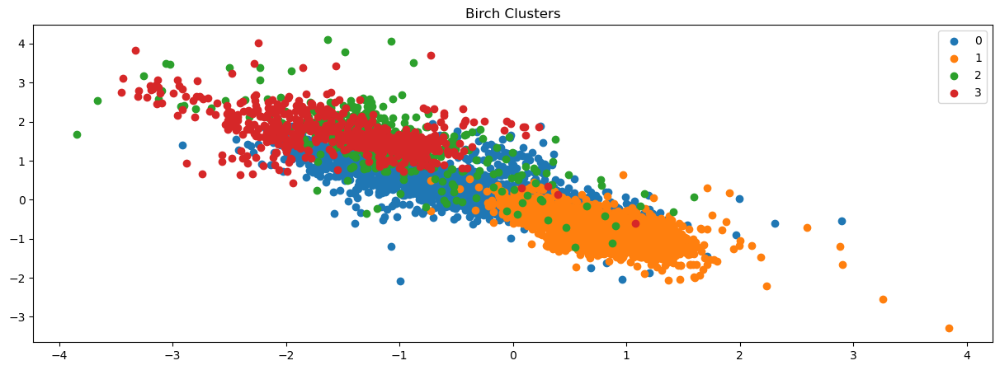

In [40]:
plt.figure(figsize=(15,5))
for i in ul:
    plt.scatter(X_bir[y_bir==i, 12], X_bir[y_bir==i, 14], label = i)
plt.title('Birch Clusters')
plt.legend()
plt.show()

### DBSCAN

In [45]:
df4 = pd.read_csv('anuran\Frogs_MFCCs.csv')
df4.drop(columns=['Family', 'Genus','Species'],inplace=True)

In [151]:
scaler = StandardScaler()
X_db = scaler.fit_transform(df4)
db_model = DBSCAN(eps=2, min_samples=200) #Para obtener los 4 grupos + 1
y_db = db_model.fit_predict(X_db)
ul = np.unique(y_db)

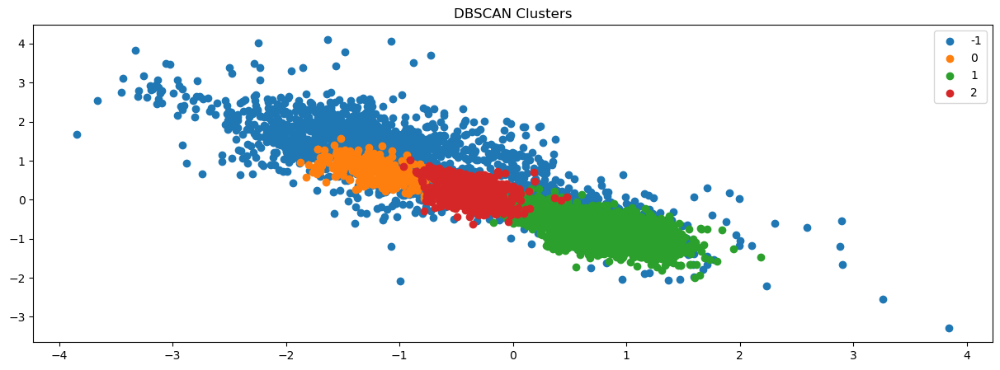

In [152]:
plt.figure(figsize=(15,5))
for i in ul:
    plt.scatter(X_db[y_db==i, 12], X_db[y_db==i, 14], label = i)
plt.title('DBSCAN Clusters')
plt.legend()
plt.show()